# Introduction

1. I have never worked on identifying critical points in images and matching them, so I had no idea how to solve this task or what points are considered good critical points. Also, I don't understand how the results can be used in any task.
2. I solved this task over a couple of evenings because I had limited time due to a university session. I couldn't figure out the deep learning option, so I chose to solve it with classic algorithms. Not because I think they are better,  because I haven't had the knowledge to use other alternatives yet.

# Data analysis

Let's start with data analysis. Let's open our satellite images and see what data we have.

In [14]:
import rasterio
from rasterio.plot import reshape_as_image
import rasterio.mask

import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [2]:
def show_data_sample(raster_path: str) -> None:
    with rasterio.open(raster_path, "r", driver="JP2OpenJPEG") as src:
        raster_img = src.read()

    raster_img = reshape_as_image(raster_img)
    plt.figure(figsize=(15,15))
    plt.imshow(raster_img)

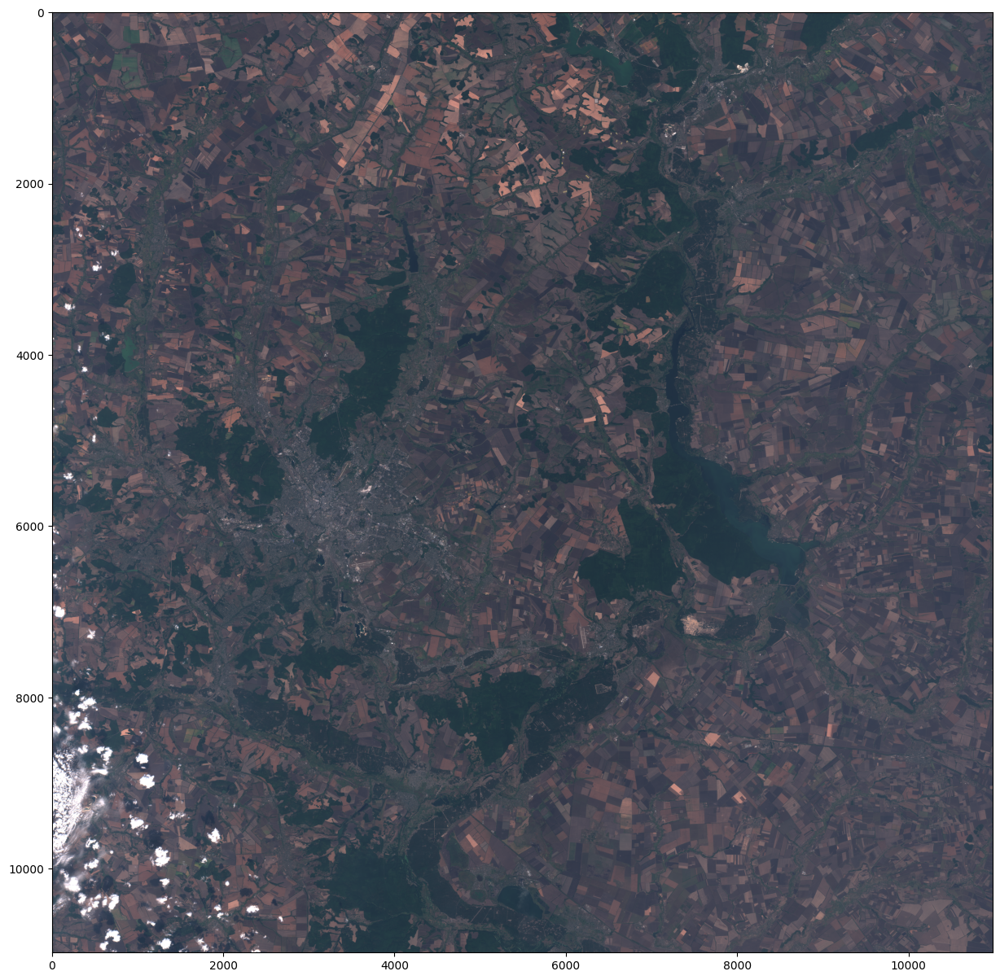

In [3]:
path_autumn = "archive/S2A_MSIL1C_20190904T083601_N0208_R064_T36UYA_20190904T110155/S2A_MSIL1C_20190904T083601_N0208_R064_T36UYA_20190904T110155.SAFE/GRANULE/L1C_T36UYA_A021940_20190904T084432/IMG_DATA/T36UYA_20190904T083601_TCI.jp2"
show_data_sample(path_autumn)

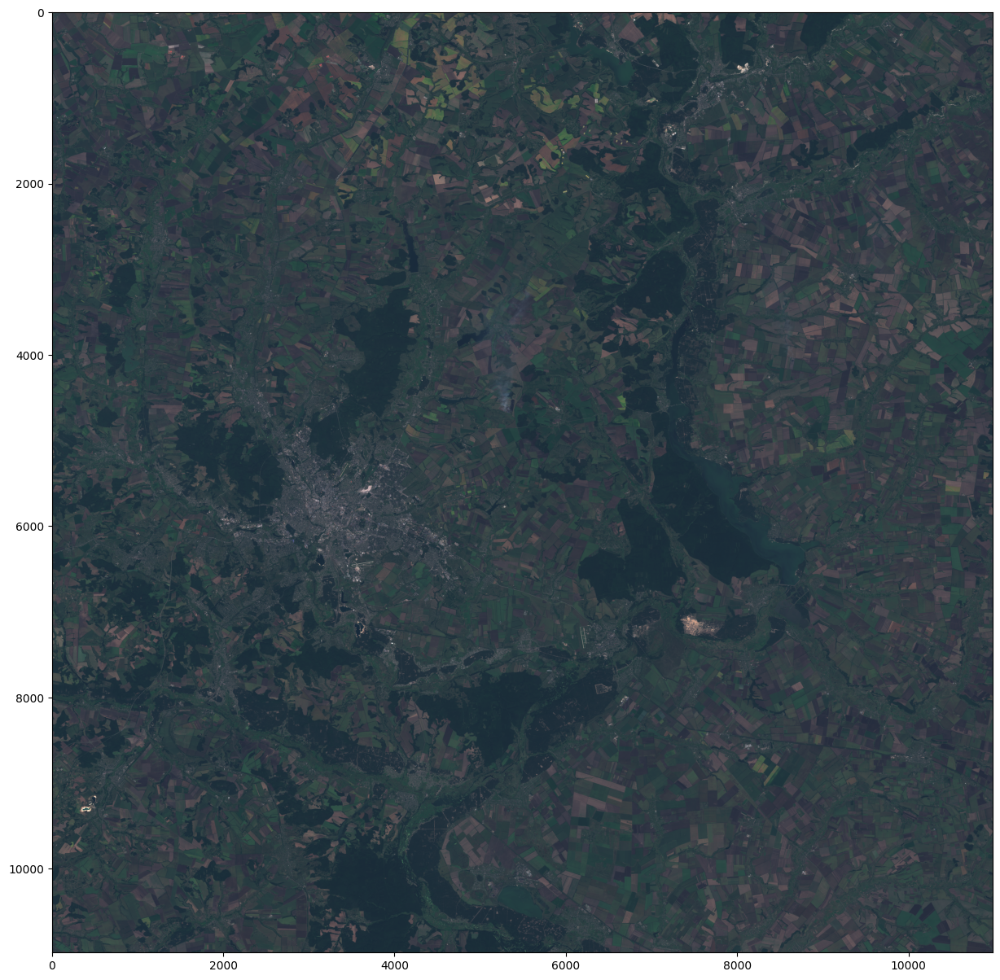

In [4]:
path_summer = "archive/S2A_MSIL1C_20160830T083602_N0204_R064_T36UYA_20160830T083600/S2A_MSIL1C_20160830T083602_N0204_R064_T36UYA_20160830T083600.SAFE/GRANULE/L1C_T36UYA_A006210_20160830T083600/IMG_DATA/T36UYA_20160830T083602_TCI.jp2"
show_data_sample(path_summer)

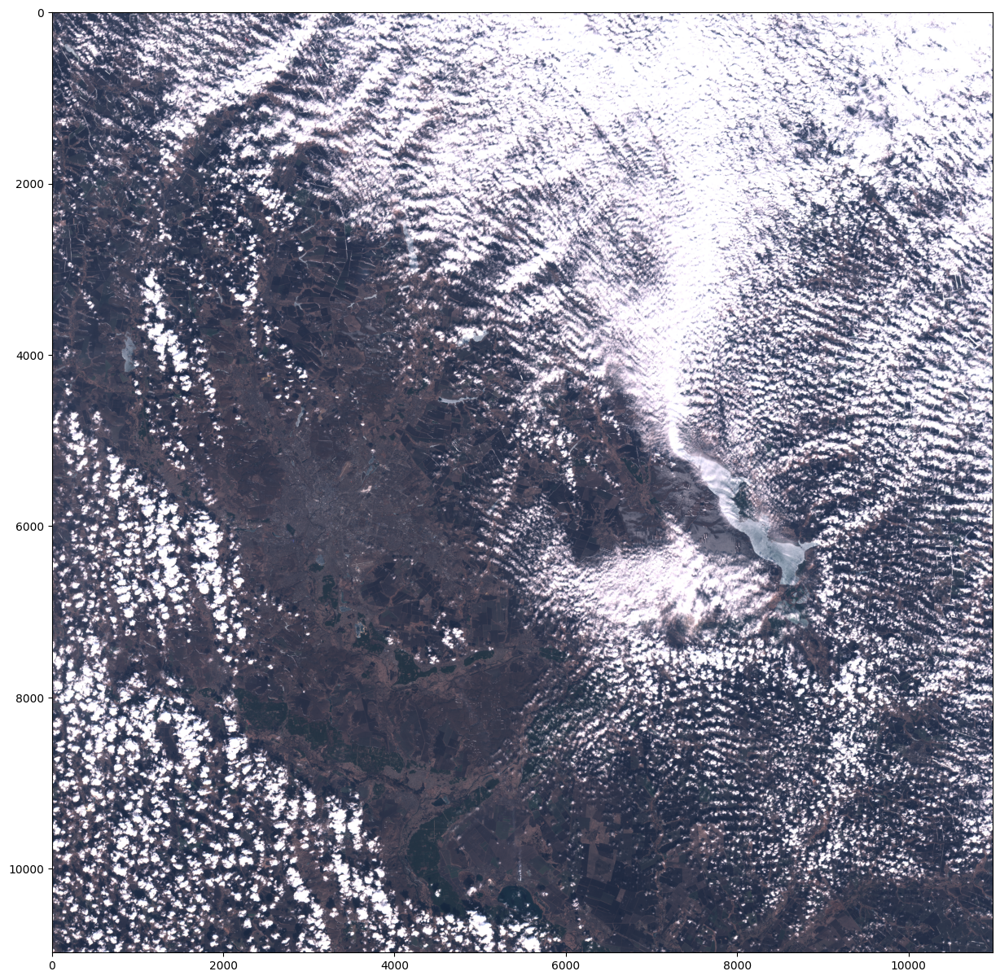

In [5]:
path_cloud = "archive/S2A_MSIL1C_20190318T083701_N0207_R064_T36UYA_20190318T122410/S2A_MSIL1C_20190318T083701_N0207_R064_T36UYA_20190318T122410.SAFE/GRANULE/L1C_T36UYA_A019509_20190318T083954/IMG_DATA/T36UYA_20190318T083701_TCI.jp2"
show_data_sample(path_cloud)

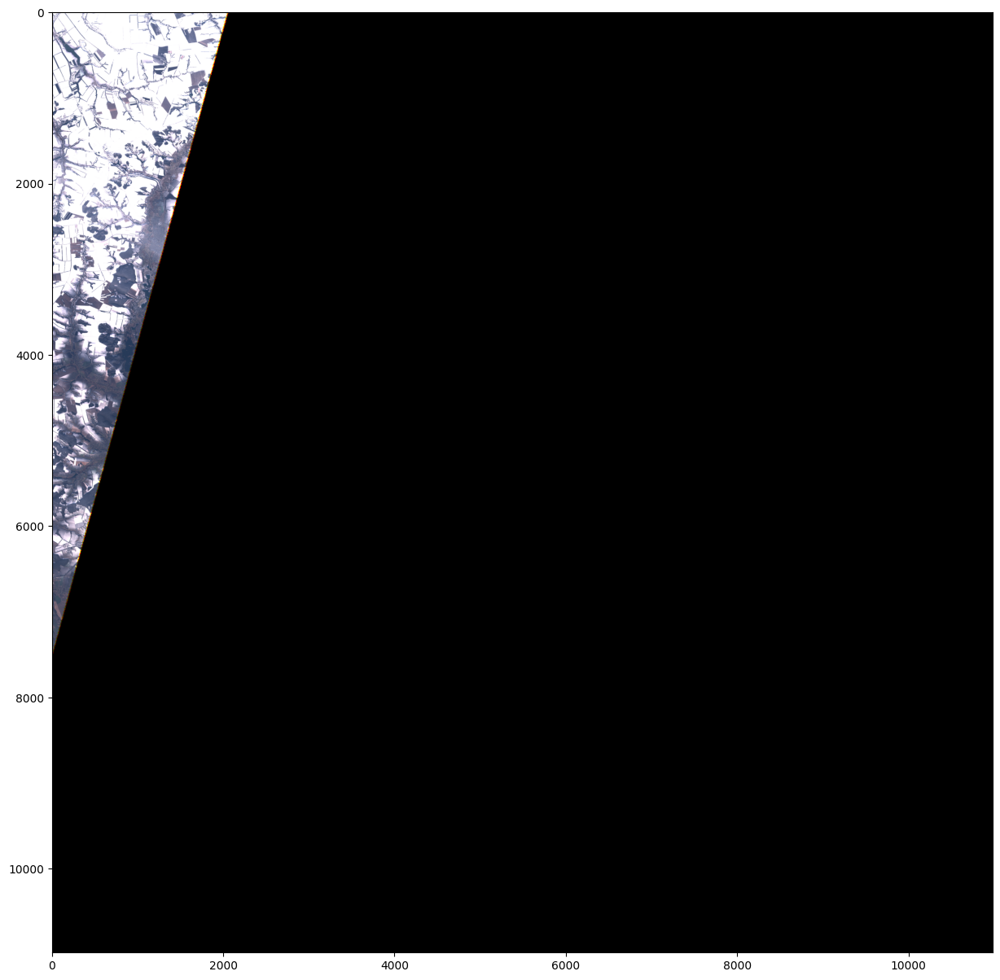

In [6]:
path_snow = "archive/S2A_MSIL1C_20161121T085252_N0204_R107_T36UYA_20161121T085252/S2A_MSIL1C_20161121T085252_N0204_R107_T36UYA_20161121T085252.SAFE/GRANULE/L1C_T36UYA_A007397_20161121T085252/IMG_DATA/T36UYA_20161121T085252_TCI.jp2"
show_data_sample(path_snow)

 I noticed that our data can be divided into three main groups:
    - first, when we have a clear, beautiful photo taken in different seasons
    - second, when snow or other phenomena might change the photo's appearance
    - third, when it is obscured by clouds.



At this point, I had the idea that our main problems are related to water (snow and clouds). Perhaps we have the necessary frequency range in the bands of our satellite that allows us to see well through snow or clouds.


I started searching online for the necessary frequency ranges, but unfortunately, I couldn't find an answer. Afterward, I contacted a friend who is an astronomer. He mentioned that to effectively see through clouds or snow caps, we need long wavelengths on the order of centimeters, and sometimes even decimeters. Unfortunately, such frequency ranges are not available in our images. So I drop this idea.


After that, I started thinking about how else we could standardize our data for different seasons. Maybe we need to select some key objects from all this data that don't change with the seasons. At that moment, I thought that it probably involves something more static, like lakes, rivers, and terrain features.


In the dataset description, I saw that different types of bands are used for studying various phenomena. Therefore, I decided to try viewing our images in these bands. For my research, I chose:
1. the normal range of visible light (Natural Color (B4, B3, B2))
2. the range for landscapes (Geology (B12, B11, B2))
3. the range for water bodies and vegetation. (Vegetation Index (B8-B4)/(B8+B4))

I took this information from this source: https://gisgeography.com/sentinel-2-bands-combinations/

In next part, we will specifically discuss our third option, as it turned out to be the best. I apologize for not showing the others.

# Algorithm implementation

The solution to this task in its classic form consists of three main parts:

Keypoint Detection: This step involves finding distinctive points or features in the image. These keypoints are typically invariant to changes in scale, illumination, and rotation, which makes them useful for tracking objects over time.
Here I tried: ORB, SIFT, BRISK, AKAZE
the best option is AKAZE

Feature Description: This step involves creating a unique descriptor for each keypoint. This descriptor is used to match keypoints between frames, which allows the object to be tracked.
Here I tried: ORB, SIFT, BRISK, BRIEF, FREAK
the best option is SIFT

Feature Matching: This step involves finding the matches between keypoints in different frames. This is done by comparing the descriptors of the keypoints.
Here I tried only basic Brute-Force Matcher based on KNN.

Well, let's implement the AKAZE + SIFT + Brute-Force KNN pipeline for our data.
Let me remind you that we will use Vegetation Index (B8-B4)/(B8+B4) as input data.

In [23]:
def kp_match(data_path1: str, data_path2: str, output_path: str) -> None:
    """
    This function performs keypoint matching on two satellite images
    It calculates the Vegetation Index (B8-B4)/(B8+B4) for each image and uses keypoint detection and matching algorithms to find similarities.

    Parameters:
    data_path1 (str): The file path to the first satellite image. Path to _TCI.jp2 file.
    data_path2 (str): The file path to the second satellite image. Path to _TCI.jp2 file.
    But keep the standard directory structure of Sentinel-2 as we will use other data from it.

    output_path(str): The path to result file. Image in JPG format.

    Returns:
    None: The function does not return anything. Instead, it saves and displays an image showing the matched keypoints between the two input images.
    """
    # Replacing the file suffix to get paths for Band 4 (red) and Band 8 (NIR)
    data_path1_b4 = data_path1.replace("TCI", "B04")
    data_path1_b8 = data_path1.replace("TCI", "B08")

    # Opening and reading the true color image (TCI) from the first data path
    with rasterio.open(data_path1, "r", driver="JP2OpenJPEG") as src:
        raster_img1 = src.read()
    raster_img1 = reshape_as_image(raster_img1)

    # Opening and reading Band 4 and Band 8 images for the first data path
    with rasterio.open(data_path1_b4, "r", driver="JP2OpenJPEG") as src:
        raster_img1_b4 = src.read()
    raster_img1_b4 = reshape_as_image(raster_img1_b4)
    with rasterio.open(data_path1_b8, "r", driver="JP2OpenJPEG") as src:
        raster_img1_b8 = src.read()
    raster_img1_b8 = reshape_as_image(raster_img1_b8)

    # Calculating the Vegetation Index (B8-B4)/(B8+B4) for the first image
    raster_img1_result = (raster_img1_b8 - raster_img1_b4) / (raster_img1_b8 + raster_img1_b4)

    # Repeating the process for the second data path
    data_path2_b4 = data_path2.replace("TCI", "B04")
    data_path2_b8 = data_path2.replace("TCI", "B08")
    with rasterio.open(data_path2, "r", driver="JP2OpenJPEG") as src:
        raster_img2 = src.read()
    raster_img2 = reshape_as_image(raster_img2)

    with rasterio.open(data_path2_b4, "r", driver="JP2OpenJPEG") as src:
        raster_img2_b4 = src.read()
    raster_img2_b4 = reshape_as_image(raster_img2_b4)

    with rasterio.open(data_path2_b8, "r", driver="JP2OpenJPEG") as src:
        raster_img2_b8 = src.read()
    raster_img2_b8 = reshape_as_image(raster_img2_b8)

    # Calculating the Vegetation Index (B8-B4)/(B8+B4) for the second image
    raster_img2_result = (raster_img2_b8 - raster_img2_b4) / (raster_img2_b8 + raster_img2_b4)

    # Normalizing the results to prepare for keypoint detection
    raster_img1_result_norm = np.uint8(cv.normalize(raster_img1_result, None, 0, 255, cv.NORM_MINMAX))
    raster_img2_result_norm = np.uint8(cv.normalize(raster_img2_result, None, 0, 255, cv.NORM_MINMAX))

    # Initiate keypoint detectors
    akaze = cv.AKAZE_create()
    sift = cv.SIFT_create()

    # Detect keypoints and compute descriptors using AKAZE + SIFT
    kp1 = akaze.detect(raster_img1_result_norm, None)
    kp2 = akaze.detect(raster_img2_result_norm, None)
    kp1, des1 = sift.compute(raster_img1_result_norm, kp1)
    kp2, des2 = sift.compute(raster_img2_result_norm, kp2)

    # Using BFMatcher to match keypoints
    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test to find good matches
    good = []
    threshold = 0.5  # The coefficient was adjusted during the solution process to reduce the number of incorrect connections.
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good.append([m])

    # Drawing the matches
    img3 = cv.drawMatchesKnn(
        raster_img1, kp1,
        raster_img2, kp2,
        good,
        None,
        flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    # Saving and displaying the result
    cv.imwrite(output_path, img3)
    # plt.imshow(img3), plt.show()


In [30]:
path_summer = "archive/S2A_MSIL1C_20160830T083602_N0204_R064_T36UYA_20160830T083600/S2A_MSIL1C_20160830T083602_N0204_R064_T36UYA_20160830T083600.SAFE/GRANULE/L1C_T36UYA_A006210_20160830T083600/IMG_DATA/T36UYA_20160830T083602_TCI.jp2"
path_autumn = "archive/S2A_MSIL1C_20190904T083601_N0208_R064_T36UYA_20190904T110155/S2A_MSIL1C_20190904T083601_N0208_R064_T36UYA_20190904T110155.SAFE/GRANULE/L1C_T36UYA_A021940_20190904T084432/IMG_DATA/T36UYA_20190904T083601_TCI.jp2"
path_cloud = "archive/S2A_MSIL1C_20190318T083701_N0207_R064_T36UYA_20190318T122410/S2A_MSIL1C_20190318T083701_N0207_R064_T36UYA_20190318T122410.SAFE/GRANULE/L1C_T36UYA_A019509_20190318T083954/IMG_DATA/T36UYA_20190318T083701_TCI.jp2"
path_snow = "archive/S2A_MSIL1C_20161121T085252_N0204_R107_T36UYA_20161121T085252/S2A_MSIL1C_20161121T085252_N0204_R107_T36UYA_20161121T085252.SAFE/GRANULE/L1C_T36UYA_A007397_20161121T085252/IMG_DATA/T36UYA_20161121T085252_TCI.jp2"
path_other_image = "archive/S2A_MSIL1C_20180810T083601_N0206_R064_T36UXA_20180810T124435/S2A_MSIL1C_20180810T083601_N0206_R064_T36UXA_20180810T124435.SAFE/GRANULE/L1C_T36UXA_A016363_20180810T084438/IMG_DATA/T36UXA_20180810T083601_TCI.jp2"

In [25]:
kp_match(path_summer, path_autumn, "result_autumn.jpg")

In [26]:
kp_match(path_summer, path_snow, "result_snow.jpg")

C:\Users\cuner\AppData\Local\Temp\ipykernel_11044\1995666030.py:52: RuntimeWarning: invalid value encountered in divide
  raster_img2_result = (raster_img2_b8 - raster_img2_b4) / (raster_img2_b8 + raster_img2_b4)
C:\Users\cuner\AppData\Local\Temp\ipykernel_11044\1995666030.py:56: RuntimeWarning: invalid value encountered in cast
  raster_img2_result_norm = np.uint8(cv.normalize(raster_img2_result, None, 0, 255, cv.NORM_MINMAX))


In [27]:
kp_match(path_summer, path_cloud, "result_cloud.jpg")

In [31]:
kp_match(path_summer, path_other_image, "result_other_image.jpg")
# P.S. Unfortunately, there is an overlap in the photographs, so we find common points.

C:\Users\cuner\AppData\Local\Temp\ipykernel_11044\1995666030.py:52: RuntimeWarning: invalid value encountered in divide
  raster_img2_result = (raster_img2_b8 - raster_img2_b4) / (raster_img2_b8 + raster_img2_b4)
C:\Users\cuner\AppData\Local\Temp\ipykernel_11044\1995666030.py:56: RuntimeWarning: invalid value encountered in cast
  raster_img2_result_norm = np.uint8(cv.normalize(raster_img2_result, None, 0, 255, cv.NORM_MINMAX))


# Conclusions

The task of finding critical points and their matching in satellite imagery data was solved. The solution was implemented using the AKAZE + SIFT + Brute-Force KNN pipeline, as it proved to be the best, and was based on data from B4 and B8 channels. Unfortunately, I cannot provide quality metrics or comparisons of different models because they did not perform well in this case, so essentially, the model selection was done visually. I know it's not good, but as a basic and quick solution, it was acceptable.

Improvement of the Model:
To enhance the classic algorithm, I think I tried all the main methods suitable for this task. Therefore, improvement here could be made through data preprocessing and perhaps some methods of channel combination that might yield better results.

After that, to improve the results, I would consider reading more articles and would move to a deep learning approach.

P.S. Unfortunately, I haven't had a chance to read your article (Deep Learning for Regular Change Detection in Ukrainian Forest Ecosystem With Sentinel-2), but I plan to do so soon and hope to find a solution to a similar problem through DL, understanding how to use the results I obtained.